<a href="https://colab.research.google.com/github/VijayPrakashReddy-k/Human-pose-Estimation/blob/main/Human_pose_Estimation_ONNX.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
! pip install onnx onnxruntime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 5.0 MB/s 
     |████████████████████████████████| 4.5 MB 45.8 MB/s 
     |████████████████████████████████| 46 kB 3.6 MB/s 
     |████████████████████████████████| 86 kB 5.4 MB/s 


In [18]:
import re
import os
import cv2
import onnx
import copy
import numpy as np
import onnxruntime
from PIL import Image
import onnxruntime as ort
import matplotlib.pyplot as plt
from operator import itemgetter
import torchvision.transforms as T

def hpe_onnx_inference(img_path,threshold,ort_session):
    file_name = img_path.split("/")[-1]
    name,ext = file_name.split(".")
    
    IMAGE_FILE =img_path #"Vijay.jpg"
    image = Image.open(IMAGE_FILE)
    image = image.convert('RGB')

    transform = T.Compose([T.Resize((256, 256)),T.ToTensor(),T.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])
    tr_img = transform(image)

    

    def to_numpy(tensor):
        return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

    # compute ONNX Runtime output prediction
    ort_inputs = {ort_session.get_inputs()[0].name: to_numpy(tr_img.unsqueeze(0))}
    ort_outs = ort_session.run(None, ort_inputs)

    ort_outs = np.array(ort_outs[0][0])

    get_detached = lambda x: copy.deepcopy(x)

    JOINTS = ['0 - r ankle', '1 - r knee', '2 - r hip', '3 - l hip', '4 - l knee', '5 - l ankle', '6 - pelvis', '7 - thorax', '8 - upper neck', '9 - head top', '10 - r wrist', '11 - r elbow', '12 - r shoulder', '13 - l shoulder', '14 - l elbow', '15 - l wrist']
    JOINTS = [re.sub(r'[0-9]+|-', '', joint).strip().replace(' ', '-') for joint in JOINTS]

    POSE_PAIRS = [
    # UPPER BODY
                [9, 8],
                [8, 7],
                [7, 6],

    # LOWER BODY
                [6, 2],
                [2, 1],
                [1, 0],

                [6, 3],
                [3, 4],
                [4, 5],

    # ARMS
                [7, 12],
                [12, 11],
                [11, 10],

                [7, 13],
                [13, 14],
                [14, 15]
    ]

    _, OUT_HEIGHT, OUT_WIDTH = ort_outs.shape
    get_keypoints = lambda pose_layers: map(itemgetter(1, 3), [cv2.minMaxLoc(pose_layer) for pose_layer in pose_layers])

    path = os.getcwd()

    ## Here are all the detections
    plt.figure(figsize=(15, 15))
    for idx, pose_layer in enumerate(get_detached(ort_outs)):
        # print(pose_layer.shape)
        plt.subplot(4, 4, idx + 1)
        plt.title(f'{idx} - {JOINTS[idx]}')
        plt.imshow(image.resize((OUT_WIDTH, OUT_HEIGHT)), cmap='gray', interpolation='bicubic')
        plt.imshow(pose_layer, alpha=0.5, cmap='jet', interpolation='bicubic')
        plt.axis('off')
        #plt.title("All the Joints detections for given Image")
        plt.savefig(path + name + '_joints' + "." + ext)

    ## Here are the detections summarised in a single image
    plt.figure(figsize=(8, 8))
    plt.imshow(image.resize((OUT_WIDTH, OUT_HEIGHT)), cmap='gray', interpolation='bicubic')
    pose_layers = get_detached(ort_outs)
    pose_layers = np.clip(pose_layers, 0.7, 1.0)

    layer_sum = np.sum(pose_layers, axis=0)
    plt.imshow(layer_sum, alpha=0.5, cmap='jet', interpolation='bicubic')
    plt.axis('off')
    plt.title("All the detections summarised in a single image")
    plt.savefig(path + name + '_alljoints' + "." + ext)

    THRESHOLD = threshold
    OUT_SHAPE = (OUT_HEIGHT, OUT_WIDTH)
    image_p = cv2.imread(IMAGE_FILE)
    pose_layers = ort_outs
    key_points = list(get_keypoints(pose_layers=pose_layers))
    is_joint_plotted = [False for i in range(len(JOINTS))]
    for pose_pair in POSE_PAIRS:
        from_j, to_j = pose_pair

        from_thr, (from_x_j, from_y_j) = key_points[from_j]
        to_thr, (to_x_j, to_y_j) = key_points[to_j]

        IMG_HEIGHT, IMG_WIDTH, _ = image_p.shape

        from_x_j, to_x_j = from_x_j * IMG_WIDTH / OUT_SHAPE[0], to_x_j * IMG_WIDTH / OUT_SHAPE[0]
        from_y_j, to_y_j = from_y_j * IMG_HEIGHT / OUT_SHAPE[1], to_y_j * IMG_HEIGHT / OUT_SHAPE[1]

        from_x_j, to_x_j = int(from_x_j), int(to_x_j)
        from_y_j, to_y_j = int(from_y_j), int(to_y_j)

        if from_thr > THRESHOLD and not is_joint_plotted[from_j]:
            # this is a joint
            cv2.ellipse(image_p, (from_x_j, from_y_j), (4, 4), 0, 0, 360, (255, 255, 255), cv2.FILLED)
            is_joint_plotted[from_j] = True

        if to_thr > THRESHOLD and not is_joint_plotted[to_j]:
            # this is a joint
            cv2.ellipse(image_p, (to_x_j, to_y_j), (4, 4), 0, 0, 360, (255, 255, 255), cv2.FILLED)
            is_joint_plotted[to_j] = True

        if from_thr > THRESHOLD and to_thr > THRESHOLD:
            # this is a joint connection, plot a line
            cv2.line(image_p, (from_x_j, from_y_j), (to_x_j, to_y_j), (255, 74, 0), 3)


    return Image.fromarray(cv2.cvtColor(image_p, cv2.COLOR_RGB2BGR))

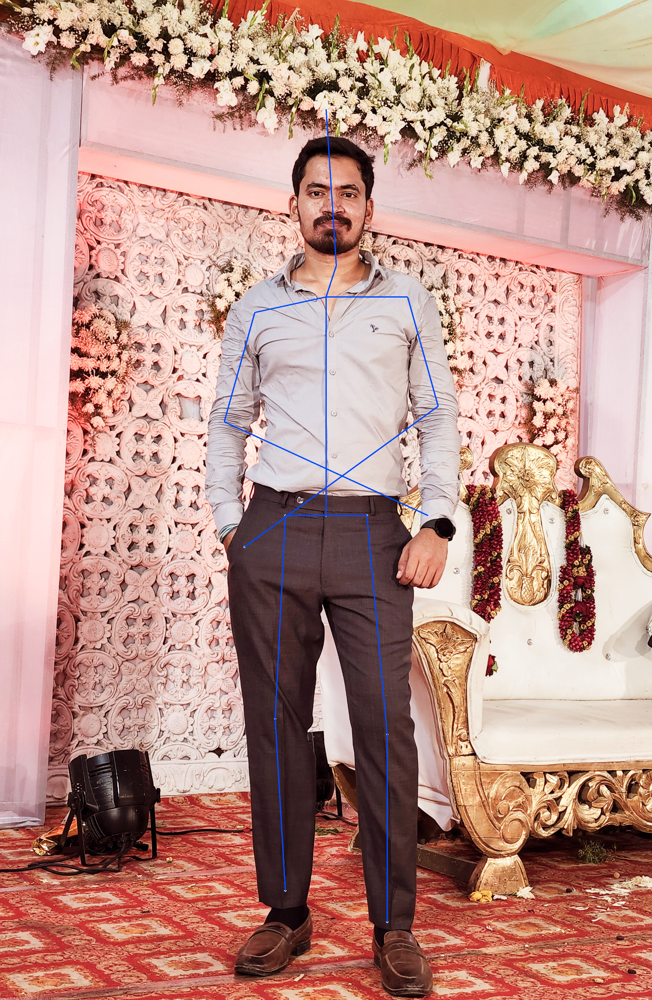

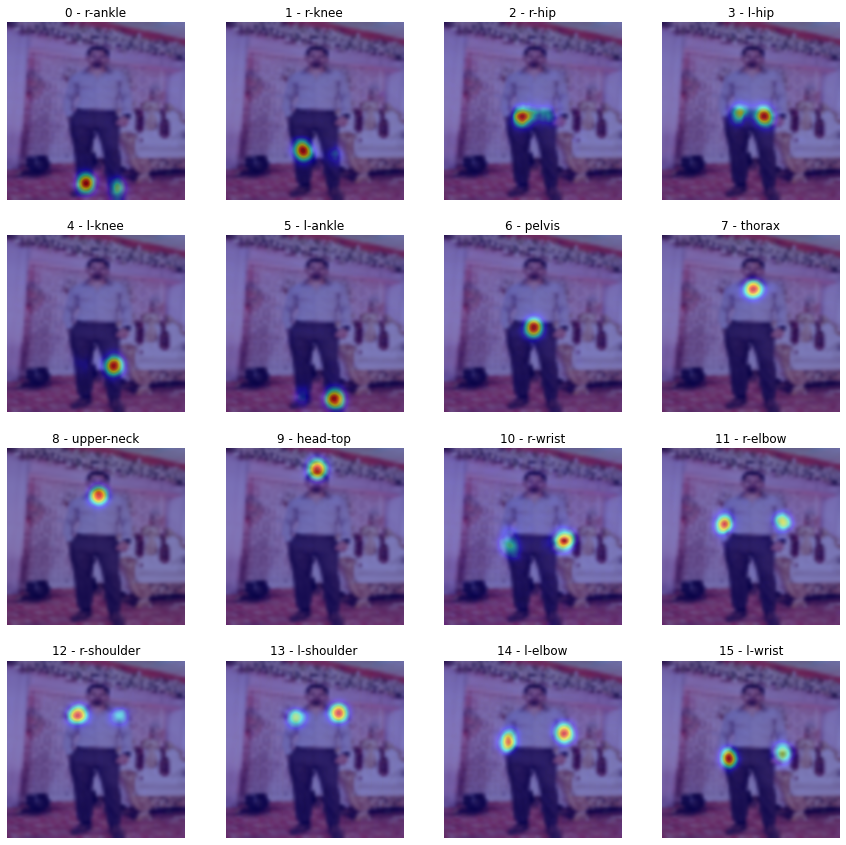

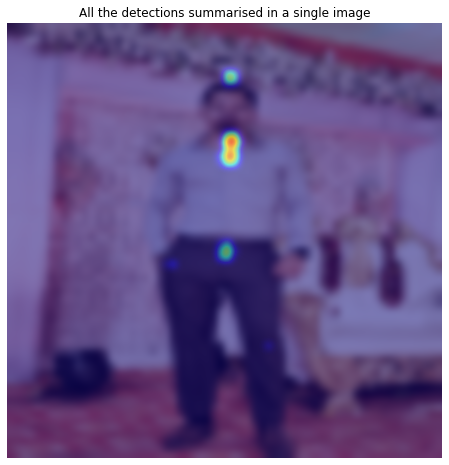

In [20]:
ort_session = onnxruntime.InferenceSession("simple_pose_estimation.onnx")
hpe_onnx_inference("Vijay.jpg",0.3,ort_session)